In [9]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Input, Conv2D, Add, ReLU, Lambda, Activation
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras import losses
from tensorflow.keras.layers import Lambda

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

Mounted at /content/drive


In [10]:
TRAIN_HR_PATH = r"C:\Users\Yousef\Desktop\temp\dataset\train\high_res"
TRAIN_LR_PATH = r"C:\Users\Yousef\Desktop\temp\dataset\train\low_res"
VAL_HR_PATH = r"C:\Users\Yousef\Desktop\temp\dataset\val\high_res"
VAL_LR_PATH = r"C:\Users\Yousef\Desktop\temp\dataset\val\low_res"
TEST_HR_PATH = r"C:\Users\Yousef\Desktop\temp\dataset\test\high_res"
TEST_LR_PATH = r"C:\Users\Yousef\Desktop\temp\dataset\test\low_res"

def load_paired_images(lr_dir, hr_dir, lr_size=(128, 128), hr_size=(256, 256)):
    lr_images, hr_images = [], []
    filenames = sorted(os.listdir(lr_dir))

    for filename in filenames:
        lr_path = os.path.join(lr_dir, filename)
        hr_path = os.path.join(hr_dir, filename)

        if os.path.exists(lr_path) and os.path.exists(hr_path):
            lr_img = cv2.imread(lr_path)
            hr_img = cv2.imread(hr_path)

            if lr_img is not None and hr_img is not None:
                lr_img = cv2.resize(cv2.cvtColor(lr_img, cv2.COLOR_BGR2RGB), lr_size)
                hr_img = cv2.resize(cv2.cvtColor(hr_img, cv2.COLOR_BGR2RGB), hr_size)

                lr_images.append(lr_img / 255.0)
                hr_images.append(hr_img / 255.0)

    return np.array(lr_images), np.array(hr_images)

lr_train, hr_train = load_paired_images(TRAIN_LR_PATH, TRAIN_HR_PATH, hr_size=(256, 256))
lr_val, hr_val = load_paired_images(VAL_LR_PATH, VAL_HR_PATH, hr_size=(256, 256))
lr_test, hr_test = load_paired_images(TEST_LR_PATH, TEST_HR_PATH, hr_size=(256, 256))

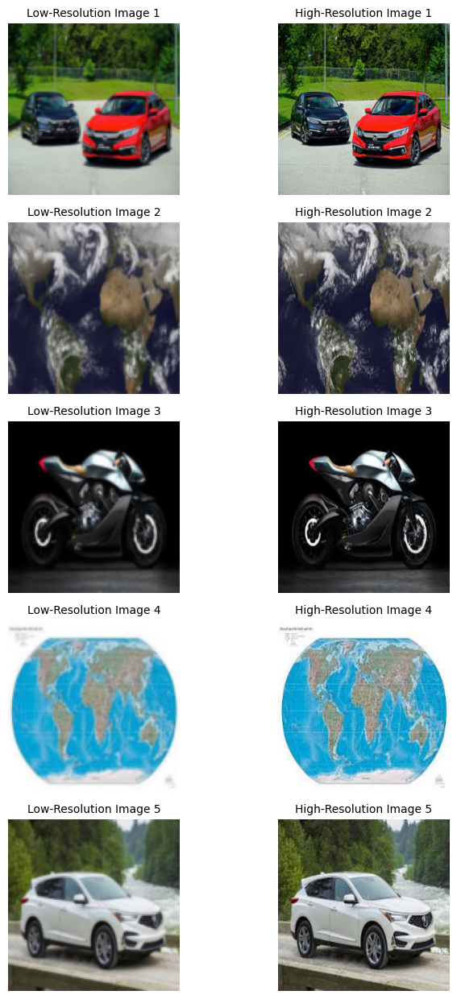

In [11]:
def show_dataset_samples(lr_images, hr_images, n=5):
    plt.figure(figsize=(8, 2.5 * n))
    for i in range(n):
        plt.subplot(n, 2, 2*i + 1)
        plt.imshow(lr_images[i])
        plt.title(f"Low-Resolution Image {i+1}", fontsize=10)
        plt.axis("off")

        plt.subplot(n, 2, 2*i + 2)
        plt.imshow(hr_images[i])
        plt.title(f"High-Resolution Image {i+1}", fontsize=10)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

show_dataset_samples(lr_train, hr_train, n=5)

In [12]:
def psnr(y_true, y_pred):
    return tf.image.psnr(y_true, y_pred, max_val=1.0)

def ssim(y_true, y_pred):
    return tf.image.ssim(y_true, y_pred, max_val=1.0)

def SubpixelConv2D(scale):
    return Lambda(lambda x: tf.nn.depth_to_space(x, scale))

def res_block(x_in, filters=64):
    x = Conv2D(filters, (3, 3), padding='same')(x_in)
    x = Activation('relu')(x)
    x = Conv2D(filters, (3, 3), padding='same')(x)
    x = Add()([x_in, x])
    return x

def build_edsr_tiny():
    inputs = Input(shape=(None, None, 3))
    x = Conv2D(64, (3, 3), padding='same')(inputs)
    for _ in range(4):
        x = res_block(x)
    x = Conv2D(3 * 4, (3, 3), padding='same')(x)
    x = SubpixelConv2D(scale=2)(x)
    return Model(inputs, x)

model = build_edsr_tiny()
model.compile(optimizer='adam', loss='mse', metrics=[psnr, ssim])
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, None,      │      1,792 │ input_layer_1[0]… │
│                     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, None,      │     36,928 │ conv2d_7[0][0]    │
│                     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, None,      │          0 │ conv2d_8[0][0]    │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, None,      │     36,928 │ activation_3[0][… │
│                     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_2 (Add)         │ (None, None,      │          0 │ conv2d_7[0][0],   │
│                     │ None, 64)         │            │ conv2d_9[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_10 (Conv2D)  │ (None, None,      │     36,928 │ add_2[0][0]       │
│                     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, None,      │          0 │ conv2d_10[0][0]   │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_11 (Conv2D)  │ (None, None,      │     36,928 │ activation_4[0][… │
│                     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_3 (Add)         │ (None, None,      │          0 │ add_2[0][0],      │
│                     │ None, 64)         │            │ conv2d_11[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_12 (Conv2D)  │ (None, None,      │     36,928 │ add_3[0][0]       │
│                     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_5        │ (None, None,      │          0 │ conv2d_12[0][0]   │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_13 (Conv2D)  │ (None, None,      │     36,928 │ activation_5[0][… │
│                     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_4 (Add)         │ (None, None,      │          0 │ add_3[0][0],      │
│                     │ None, 64)         │            │ conv2d_13[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_14 (Conv2D)  │ (None, None,      │     36,928 │ add_4[0][0]       │
│                     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_6        │ (None, None,      │          0 │ conv2d_14[0][0]   │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_15 (Conv2D)  │ (None, None,      │     36,928 │ activation_6[0][

 Total params: 304,140 (1.16 MB)

 Trainable params: 304,140 (1.16 MB)

 Non-trainable params: 0 (0.00 B)

In [13]:
early_stop = EarlyStopping(monitor='val_psnr', patience=10, mode='max', restore_best_weights=True)
checkpoint = ModelCheckpoint("best_edsr_model.h5", monitor='val_psnr', save_best_only=True, mode='max')

history = model.fit(
    lr_train, hr_train,
    validation_data=(lr_val, hr_val),
    epochs=150,
    batch_size=16,
    callbacks=[early_stop, checkpoint]
)

Epoch 1/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.1186 - psnr: 14.9957 - ssim: 0.2586

43/43 ━━━━━━━━━━━━━━━━━━━━ 286s 7s/step - loss: 0.1168 - psnr: 15.0956 - ssim: 0.2625 - val_loss: 0.0047 - val_psnr: 23.9930 - val_ssim: 0.6668
Epoch 2/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.0038 - psnr: 25.1710 - ssim: 0.7210

43/43 ━━━━━━━━━━━━━━━━━━━━ 283s 7s/step - loss: 0.0037 - psnr: 25.1877 - ssim: 0.7217 - val_loss: 0.0025 - val_psnr: 26.9593 - val_ssim: 0.7949
Epoch 3/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 288s 7s/step - loss: 0.0023 - psnr: 27.4240 - ssim: 0.8113 - val_loss: 0.0026 - val_psnr: 26.5549 - val_ssim: 0.8194
Epoch 4/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - loss: 0.0022 - psnr: 27.2836 - ssim: 0.8258

43/43 ━━━━━━━━━━━━━━━━━━━━ 303s 7s/step - loss: 0.0022 - psnr: 27.3012 - ssim: 0.8261 - val_loss: 0.0018 - val_psnr: 28.4935 - val_ssim: 0.8481
Epoch 5/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 303s 7s/step - loss: 0.0015 - psnr: 29.0151 - ssim: 0.8651 - val_loss: 0.0019 - val_psnr: 28.1591 - val_ssim: 0.8597
Epoch 6/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - loss: 0.0016 - psnr: 29.0155 - ssim: 0.8673

43/43 ━━━━━━━━━━━━━━━━━━━━ 294s 7s/step - loss: 0.0016 - psnr: 29.0224 - ssim: 0.8674 - val_loss: 0.0015 - val_psnr: 29.2317 - val_ssim: 0.8698
Epoch 7/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 287s 7s/step - loss: 0.0015 - psnr: 29.3540 - ssim: 0.8778 - val_loss: 0.0015 - val_psnr: 29.0924 - val_ssim: 0.8788
Epoch 8/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.0014 - psnr: 29.6079 - ssim: 0.8865

43/43 ━━━━━━━━━━━━━━━━━━━━ 278s 6s/step - loss: 0.0014 - psnr: 29.6112 - ssim: 0.8865 - val_loss: 0.0014 - val_psnr: 29.7634 - val_ssim: 0.8890
Epoch 9/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 284s 7s/step - loss: 0.0013 - psnr: 29.8202 - ssim: 0.8909 - val_loss: 0.0014 - val_psnr: 29.3789 - val_ssim: 0.8863
Epoch 10/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - loss: 0.0012 - psnr: 30.0925 - ssim: 0.8937

43/43 ━━━━━━━━━━━━━━━━━━━━ 302s 7s/step - loss: 0.0012 - psnr: 30.0923 - ssim: 0.8938 - val_loss: 0.0013 - val_psnr: 29.8332 - val_ssim: 0.8934
Epoch 11/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - loss: 0.0012 - psnr: 30.3388 - ssim: 0.9015

43/43 ━━━━━━━━━━━━━━━━━━━━ 298s 7s/step - loss: 0.0012 - psnr: 30.3365 - ssim: 0.9014 - val_loss: 0.0013 - val_psnr: 30.1266 - val_ssim: 0.8963
Epoch 12/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 312s 7s/step - loss: 0.0015 - psnr: 29.2680 - ssim: 0.8821 - val_loss: 0.0014 - val_psnr: 29.4323 - val_ssim: 0.8713
Epoch 13/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.0012 - psnr: 30.2610 - ssim: 0.8915

43/43 ━━━━━━━━━━━━━━━━━━━━ 317s 7s/step - loss: 0.0012 - psnr: 30.2610 - ssim: 0.8915 - val_loss: 0.0012 - val_psnr: 30.2686 - val_ssim: 0.9007
Epoch 14/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - loss: 0.0012 - psnr: 30.4546 - ssim: 0.9044

43/43 ━━━━━━━━━━━━━━━━━━━━ 301s 7s/step - loss: 0.0012 - psnr: 30.4574 - ssim: 0.9045 - val_loss: 0.0012 - val_psnr: 30.3651 - val_ssim: 0.9029
Epoch 15/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 292s 7s/step - loss: 0.0012 - psnr: 30.4498 - ssim: 0.9061 - val_loss: 0.0013 - val_psnr: 30.0560 - val_ssim: 0.8999
Epoch 16/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 293s 7s/step - loss: 0.0012 - psnr: 30.3081 - ssim: 0.9045 - val_loss: 0.0012 - val_psnr: 30.3290 - val_ssim: 0.8948
Epoch 17/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.0011 - psnr: 30.6083 - ssim: 0.9058

43/43 ━━━━━━━━━━━━━━━━━━━━ 305s 6s/step - loss: 0.0011 - psnr: 30.6090 - ssim: 0.9059 - val_loss: 0.0012 - val_psnr: 30.5526 - val_ssim: 0.9051
Epoch 18/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - loss: 0.0011 - psnr: 30.6145 - ssim: 0.9072

43/43 ━━━━━━━━━━━━━━━━━━━━ 307s 7s/step - loss: 0.0011 - psnr: 30.6139 - ssim: 0.9072 - val_loss: 0.0011 - val_psnr: 30.5834 - val_ssim: 0.9047
Epoch 19/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 302s 7s/step - loss: 0.0011 - psnr: 30.5954 - ssim: 0.9045 - val_loss: 0.0013 - val_psnr: 29.6223 - val_ssim: 0.8953
Epoch 20/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 298s 7s/step - loss: 0.0012 - psnr: 30.2324 - ssim: 0.8987 - val_loss: 0.0011 - val_psnr: 30.5727 - val_ssim: 0.9058
Epoch 21/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.0010 - psnr: 30.9080 - ssim: 0.9133

43/43 ━━━━━━━━━━━━━━━━━━━━ 304s 6s/step - loss: 0.0010 - psnr: 30.9032 - ssim: 0.9132 - val_loss: 0.0011 - val_psnr: 30.6623 - val_ssim: 0.9082
Epoch 22/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 287s 7s/step - loss: 0.0011 - psnr: 30.7613 - ssim: 0.9103 - val_loss: 0.0014 - val_psnr: 29.5096 - val_ssim: 0.8912
Epoch 23/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 279s 6s/step - loss: 0.0011 - psnr: 30.4445 - ssim: 0.9008 - val_loss: 0.0011 - val_psnr: 30.6016 - val_ssim: 0.9069
Epoch 24/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 300s 7s/step - loss: 0.0011 - psnr: 30.6221 - ssim: 0.9084 - val_loss: 0.0012 - val_psnr: 30.0884 - val_ssim: 0.9019
Epoch 25/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.0011 - psnr: 30.4531 - ssim: 0.9066

43/43 ━━━━━━━━━━━━━━━━━━━━ 298s 6s/step - loss: 0.0011 - psnr: 30.4557 - ssim: 0.9066 - val_loss: 0.0011 - val_psnr: 30.7533 - val_ssim: 0.9102
Epoch 26/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.0010 - psnr: 31.1292 - ssim: 0.9164

43/43 ━━━━━━━━━━━━━━━━━━━━ 272s 6s/step - loss: 0.0010 - psnr: 31.1268 - ssim: 0.9163 - val_loss: 0.0011 - val_psnr: 30.8939 - val_ssim: 0.9117
Epoch 27/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 298s 7s/step - loss: 0.0011 - psnr: 30.8432 - ssim: 0.9121 - val_loss: 0.0011 - val_psnr: 30.8671 - val_ssim: 0.9129
Epoch 28/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 282s 7s/step - loss: 0.0011 - psnr: 30.9099 - ssim: 0.9132 - val_loss: 0.0014 - val_psnr: 29.3033 - val_ssim: 0.8989
Epoch 29/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 298s 7s/step - loss: 0.0011 - psnr: 30.5809 - ssim: 0.9092 - val_loss: 0.0011 - val_psnr: 30.8328 - val_ssim: 0.9108
Epoch 30/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 284s 7s/step - loss: 9.9904e-04 - psnr: 31.1306 - ssim: 0.9172 - val_loss: 0.0014 - val_psnr: 29.4677 - val_ssim: 0.9048
Epoch 31/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 293s 7s/step - loss: 0.0013 - psnr: 29.9328 - ssim: 0.8977 - val_loss: 0.0011 - val_psnr: 30.5256 - val_ssim: 0.8973
Epoch 32/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.0010 -

43/43 ━━━━━━━━━━━━━━━━━━━━ 282s 7s/step - loss: 0.0010 - psnr: 31.0099 - ssim: 0.9095 - val_loss: 0.0011 - val_psnr: 30.9658 - val_ssim: 0.9125
Epoch 33/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 282s 7s/step - loss: 9.8345e-04 - psnr: 31.3657 - ssim: 0.9157 - val_loss: 0.0011 - val_psnr: 30.6341 - val_ssim: 0.9100
Epoch 34/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 9.8977e-04 - psnr: 31.1479 - ssim: 0.9147

43/43 ━━━━━━━━━━━━━━━━━━━━ 306s 6s/step - loss: 9.9015e-04 - psnr: 31.1479 - ssim: 0.9147 - val_loss: 0.0010 - val_psnr: 30.9777 - val_ssim: 0.9103
Epoch 35/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 276s 6s/step - loss: 0.0011 - psnr: 30.8203 - ssim: 0.9106 - val_loss: 0.0012 - val_psnr: 30.0199 - val_ssim: 0.9067
Epoch 36/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 274s 6s/step - loss: 0.0011 - psnr: 30.7647 - ssim: 0.9145 - val_loss: 0.0012 - val_psnr: 30.2112 - val_ssim: 0.9046
Epoch 37/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.0010 - psnr: 31.0690 - ssim: 0.9155

43/43 ━━━━━━━━━━━━━━━━━━━━ 275s 6s/step - loss: 0.0010 - psnr: 31.0710 - ssim: 0.9155 - val_loss: 0.0010 - val_psnr: 31.0379 - val_ssim: 0.9133
Epoch 38/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 9.9510e-04 - psnr: 31.1908 - ssim: 0.9174

43/43 ━━━━━━━━━━━━━━━━━━━━ 287s 7s/step - loss: 9.9497e-04 - psnr: 31.1916 - ssim: 0.9174 - val_loss: 0.0010 - val_psnr: 31.1363 - val_ssim: 0.9151
Epoch 39/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 281s 7s/step - loss: 0.0010 - psnr: 31.1852 - ssim: 0.9177 - val_loss: 0.0010 - val_psnr: 31.0615 - val_ssim: 0.9157
Epoch 40/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 312s 6s/step - loss: 9.7184e-04 - psnr: 31.4205 - ssim: 0.9213 - val_loss: 0.0010 - val_psnr: 31.0807 - val_ssim: 0.9161
Epoch 41/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 271s 6s/step - loss: 0.0010 - psnr: 31.1391 - ssim: 0.9173 - val_loss: 0.0010 - val_psnr: 31.0824 - val_ssim: 0.9159
Epoch 42/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 264s 6s/step - loss: 9.6641e-04 - psnr: 31.3809 - ssim: 0.9183 - val_loss: 0.0011 - val_psnr: 30.7312 - val_ssim: 0.9150
Epoch 43/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 270s 6s/step - loss: 0.0010 - psnr: 31.0866 - ssim: 0.9174 - val_loss: 0.0010 - val_psnr: 30.9240 - val_ssim: 0.9135
Epoch 44/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 

43/43 ━━━━━━━━━━━━━━━━━━━━ 330s 6s/step - loss: 9.8878e-04 - psnr: 31.1874 - ssim: 0.9195 - val_loss: 0.0010 - val_psnr: 31.1990 - val_ssim: 0.9164
Epoch 45/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 311s 7s/step - loss: 9.8108e-04 - psnr: 31.2295 - ssim: 0.9176 - val_loss: 0.0011 - val_psnr: 30.7013 - val_ssim: 0.9148
Epoch 46/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 278s 6s/step - loss: 9.9712e-04 - psnr: 31.0182 - ssim: 0.9140 - val_loss: 0.0011 - val_psnr: 30.7394 - val_ssim: 0.9106
Epoch 47/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 0.0010 - psnr: 30.9943 - ssim: 0.9163

43/43 ━━━━━━━━━━━━━━━━━━━━ 263s 6s/step - loss: 0.0010 - psnr: 31.0033 - ssim: 0.9164 - val_loss: 9.9445e-04 - val_psnr: 31.2606 - val_ssim: 0.9167
Epoch 48/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 275s 6s/step - loss: 9.9848e-04 - psnr: 31.1566 - ssim: 0.9176 - val_loss: 0.0011 - val_psnr: 30.8942 - val_ssim: 0.9123
Epoch 49/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 266s 6s/step - loss: 9.7273e-04 - psnr: 31.3024 - ssim: 0.9164 - val_loss: 9.9849e-04 - val_psnr: 31.2380 - val_ssim: 0.9160
Epoch 50/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 234s 5s/step - loss: 9.9139e-04 - psnr: 31.3147 - ssim: 0.9178 - val_loss: 0.0010 - val_psnr: 31.2114 - val_ssim: 0.9168
Epoch 51/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 9.7404e-04 - psnr: 31.4532 - ssim: 0.9196

43/43 ━━━━━━━━━━━━━━━━━━━━ 236s 5s/step - loss: 9.7358e-04 - psnr: 31.4522 - ssim: 0.9196 - val_loss: 9.8955e-04 - val_psnr: 31.2889 - val_ssim: 0.9182
Epoch 52/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 258s 6s/step - loss: 9.3614e-04 - psnr: 31.4725 - ssim: 0.9211 - val_loss: 9.9387e-04 - val_psnr: 31.2350 - val_ssim: 0.9171
Epoch 53/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 266s 6s/step - loss: 9.3879e-04 - psnr: 31.4990 - ssim: 0.9201 - val_loss: 0.0010 - val_psnr: 31.1999 - val_ssim: 0.9182
Epoch 54/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 258s 6s/step - loss: 9.5668e-04 - psnr: 31.4003 - ssim: 0.9193 - val_loss: 0.0010 - val_psnr: 31.0569 - val_ssim: 0.9153
Epoch 55/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 251s 6s/step - loss: 0.0010 - psnr: 31.0293 - ssim: 0.9125 - val_loss: 0.0010 - val_psnr: 31.1749 - val_ssim: 0.9127
Epoch 56/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 260s 6s/step - loss: 9.4827e-04 - psnr: 31.4167 - ssim: 0.9157 - val_loss: 0.0011 - val_psnr: 30.4115 - val_ssim: 0.9081
Epoch 57/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 267

43/43 ━━━━━━━━━━━━━━━━━━━━ 320s 6s/step - loss: 9.5657e-04 - psnr: 31.4183 - ssim: 0.9176 - val_loss: 9.7396e-04 - val_psnr: 31.3476 - val_ssim: 0.9170
Epoch 60/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 295s 7s/step - loss: 9.1131e-04 - psnr: 31.7337 - ssim: 0.9217 - val_loss: 9.9918e-04 - val_psnr: 31.1573 - val_ssim: 0.9199
Epoch 61/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - loss: 8.6307e-04 - psnr: 31.7098 - ssim: 0.9239

43/43 ━━━━━━━━━━━━━━━━━━━━ 322s 7s/step - loss: 8.6476e-04 - psnr: 31.7045 - ssim: 0.9239 - val_loss: 9.6991e-04 - val_psnr: 31.3852 - val_ssim: 0.9190
Epoch 62/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 329s 7s/step - loss: 9.5991e-04 - psnr: 31.2474 - ssim: 0.9204 - val_loss: 0.0010 - val_psnr: 31.0512 - val_ssim: 0.9155
Epoch 63/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 275s 6s/step - loss: 9.5237e-04 - psnr: 31.3153 - ssim: 0.9200 - val_loss: 9.6833e-04 - val_psnr: 31.3632 - val_ssim: 0.9193
Epoch 64/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 9.0918e-04 - psnr: 31.6838 - ssim: 0.9229

43/43 ━━━━━━━━━━━━━━━━━━━━ 270s 6s/step - loss: 9.0906e-04 - psnr: 31.6841 - ssim: 0.9229 - val_loss: 9.5251e-04 - val_psnr: 31.4642 - val_ssim: 0.9211
Epoch 65/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 271s 6s/step - loss: 8.8021e-04 - psnr: 31.7528 - ssim: 0.9243 - val_loss: 9.8938e-04 - val_psnr: 31.1740 - val_ssim: 0.9194
Epoch 66/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 8.8824e-04 - psnr: 31.6568 - ssim: 0.9239

43/43 ━━━━━━━━━━━━━━━━━━━━ 332s 7s/step - loss: 8.8860e-04 - psnr: 31.6570 - ssim: 0.9239 - val_loss: 9.4769e-04 - val_psnr: 31.4931 - val_ssim: 0.9206
Epoch 67/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 330s 7s/step - loss: 9.0425e-04 - psnr: 31.7507 - ssim: 0.9236 - val_loss: 0.0012 - val_psnr: 30.1006 - val_ssim: 0.9159
Epoch 68/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 314s 7s/step - loss: 0.0011 - psnr: 30.3992 - ssim: 0.9061 - val_loss: 9.8633e-04 - val_psnr: 31.2121 - val_ssim: 0.9098
Epoch 69/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 312s 6s/step - loss: 9.5680e-04 - psnr: 31.3276 - ssim: 0.9141 - val_loss: 9.5450e-04 - val_psnr: 31.4310 - val_ssim: 0.9174
Epoch 70/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 338s 7s/step - loss: 9.0492e-04 - psnr: 31.4981 - ssim: 0.9195 - val_loss: 9.5480e-04 - val_psnr: 31.4254 - val_ssim: 0.9204
Epoch 71/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 9.2969e-04 - psnr: 31.4813 - ssim: 0.9187

43/43 ━━━━━━━━━━━━━━━━━━━━ 272s 6s/step - loss: 9.2892e-04 - psnr: 31.4867 - ssim: 0.9188 - val_loss: 9.3502e-04 - val_psnr: 31.5700 - val_ssim: 0.9217
Epoch 72/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 323s 6s/step - loss: 8.7776e-04 - psnr: 31.7771 - ssim: 0.9236 - val_loss: 9.5931e-04 - val_psnr: 31.3845 - val_ssim: 0.9195
Epoch 73/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 327s 6s/step - loss: 8.8070e-04 - psnr: 31.6926 - ssim: 0.9245 - val_loss: 9.4125e-04 - val_psnr: 31.5091 - val_ssim: 0.9202
Epoch 74/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 272s 6s/step - loss: 0.0011 - psnr: 30.5319 - ssim: 0.9138 - val_loss: 0.0013 - val_psnr: 29.7257 - val_ssim: 0.8959
Epoch 75/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 324s 6s/step - loss: 0.0011 - psnr: 30.5920 - ssim: 0.8939 - val_loss: 9.7664e-04 - val_psnr: 31.2643 - val_ssim: 0.9167
Epoch 76/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 280s 7s/step - loss: 8.6287e-04 - psnr: 31.7572 - ssim: 0.9224 - val_loss: 9.6321e-04 - val_psnr: 31.3454 - val_ssim: 0.9211
Epoch 77/150
43/43 ━━━━━━━━━━━━━━━━

43/43 ━━━━━━━━━━━━━━━━━━━━ 315s 7s/step - loss: 8.4813e-04 - psnr: 31.9308 - ssim: 0.9238 - val_loss: 9.2729e-04 - val_psnr: 31.6159 - val_ssim: 0.9224
Epoch 80/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 314s 6s/step - loss: 8.5487e-04 - psnr: 31.8532 - ssim: 0.9259 - val_loss: 0.0010 - val_psnr: 30.9702 - val_ssim: 0.9173
Epoch 81/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 263s 6s/step - loss: 9.6507e-04 - psnr: 31.3183 - ssim: 0.9192 - val_loss: 9.3184e-04 - val_psnr: 31.5619 - val_ssim: 0.9220
Epoch 82/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - loss: 8.5784e-04 - psnr: 31.9670 - ssim: 0.9250

43/43 ━━━━━━━━━━━━━━━━━━━━ 312s 6s/step - loss: 8.5818e-04 - psnr: 31.9643 - ssim: 0.9250 - val_loss: 9.1936e-04 - val_psnr: 31.6555 - val_ssim: 0.9232
Epoch 83/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 270s 6s/step - loss: 8.6986e-04 - psnr: 31.7519 - ssim: 0.9261 - val_loss: 9.7516e-04 - val_psnr: 31.2273 - val_ssim: 0.9181
Epoch 84/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 260s 6s/step - loss: 9.0543e-04 - psnr: 31.6620 - ssim: 0.9235 - val_loss: 9.2668e-04 - val_psnr: 31.5849 - val_ssim: 0.9230
Epoch 85/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 280s 6s/step - loss: 8.9934e-04 - psnr: 31.6083 - ssim: 0.9241 - val_loss: 9.5023e-04 - val_psnr: 31.4358 - val_ssim: 0.9177
Epoch 86/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 313s 6s/step - loss: 0.0011 - psnr: 30.5740 - ssim: 0.9086 - val_loss: 0.0012 - val_psnr: 29.8657 - val_ssim: 0.8778
Epoch 87/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 268s 6s/step - loss: 0.0010 - psnr: 30.8768 - ssim: 0.8923 - val_loss: 9.4680e-04 - val_psnr: 31.4485 - val_ssim: 0.9180
Epoch 88/150
43/43 ━━━━━━━━━━━━━━━━

43/43 ━━━━━━━━━━━━━━━━━━━━ 293s 7s/step - loss: 8.6015e-04 - psnr: 31.9049 - ssim: 0.9264 - val_loss: 9.1741e-04 - val_psnr: 31.6638 - val_ssim: 0.9230
Epoch 90/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 288s 7s/step - loss: 8.5476e-04 - psnr: 31.9488 - ssim: 0.9275 - val_loss: 9.1792e-04 - val_psnr: 31.6356 - val_ssim: 0.9231
Epoch 91/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 312s 6s/step - loss: 8.4010e-04 - psnr: 31.9446 - ssim: 0.9261 - val_loss: 9.1979e-04 - val_psnr: 31.6222 - val_ssim: 0.9233
Epoch 92/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 341s 7s/step - loss: 8.2820e-04 - psnr: 32.0868 - ssim: 0.9263 - val_loss: 9.2077e-04 - val_psnr: 31.6018 - val_ssim: 0.9224
Epoch 93/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - loss: 8.9207e-04 - psnr: 31.8605 - ssim: 0.9231

43/43 ━━━━━━━━━━━━━━━━━━━━ 300s 7s/step - loss: 8.9136e-04 - psnr: 31.8617 - ssim: 0.9232 - val_loss: 9.0789e-04 - val_psnr: 31.7220 - val_ssim: 0.9242
Epoch 94/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - loss: 8.5788e-04 - psnr: 31.8074 - ssim: 0.9263

43/43 ━━━━━━━━━━━━━━━━━━━━ 319s 7s/step - loss: 8.5804e-04 - psnr: 31.8090 - ssim: 0.9263 - val_loss: 9.0594e-04 - val_psnr: 31.7298 - val_ssim: 0.9238
Epoch 95/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 292s 7s/step - loss: 8.4756e-04 - psnr: 31.8385 - ssim: 0.9257 - val_loss: 9.2749e-04 - val_psnr: 31.5676 - val_ssim: 0.9199
Epoch 96/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 325s 7s/step - loss: 8.8209e-04 - psnr: 31.7796 - ssim: 0.9226 - val_loss: 9.4335e-04 - val_psnr: 31.4197 - val_ssim: 0.9225
Epoch 97/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 279s 6s/step - loss: 8.6887e-04 - psnr: 31.8989 - ssim: 0.9255 - val_loss: 9.2176e-04 - val_psnr: 31.5729 - val_ssim: 0.9233
Epoch 98/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 298s 7s/step - loss: 9.2684e-04 - psnr: 31.6605 - ssim: 0.9236 - val_loss: 9.0485e-04 - val_psnr: 31.7222 - val_ssim: 0.9239
Epoch 99/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 322s 7s/step - loss: 8.7900e-04 - psnr: 31.8292 - ssim: 0.9276 - val_loss: 9.3529e-04 - val_psnr: 31.4967 - val_ssim: 0.9221
Epoch 100/150
43/43 ━━━

43/43 ━━━━━━━━━━━━━━━━━━━━ 324s 7s/step - loss: 8.6853e-04 - psnr: 31.9049 - ssim: 0.9238 - val_loss: 9.0199e-04 - val_psnr: 31.7519 - val_ssim: 0.9244
Epoch 105/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 326s 7s/step - loss: 8.9229e-04 - psnr: 31.7792 - ssim: 0.9250 - val_loss: 9.7404e-04 - val_psnr: 31.2090 - val_ssim: 0.9211
Epoch 106/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 330s 7s/step - loss: 8.5633e-04 - psnr: 31.9370 - ssim: 0.9261 - val_loss: 9.0547e-04 - val_psnr: 31.7135 - val_ssim: 0.9245
Epoch 107/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - loss: 7.9764e-04 - psnr: 32.2390 - ssim: 0.9292

43/43 ━━━━━━━━━━━━━━━━━━━━ 319s 7s/step - loss: 7.9882e-04 - psnr: 32.2330 - ssim: 0.9292 - val_loss: 8.9726e-04 - val_psnr: 31.7643 - val_ssim: 0.9242
Epoch 108/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - loss: 8.5137e-04 - psnr: 31.8445 - ssim: 0.9260

43/43 ━━━━━━━━━━━━━━━━━━━━ 328s 8s/step - loss: 8.5121e-04 - psnr: 31.8483 - ssim: 0.9260 - val_loss: 8.9572e-04 - val_psnr: 31.7813 - val_ssim: 0.9249
Epoch 109/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 360s 7s/step - loss: 8.3034e-04 - psnr: 31.9847 - ssim: 0.9282 - val_loss: 0.0013 - val_psnr: 29.7534 - val_ssim: 0.9064
Epoch 110/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 308s 7s/step - loss: 9.8626e-04 - psnr: 31.1241 - ssim: 0.9171 - val_loss: 0.0011 - val_psnr: 30.6934 - val_ssim: 0.9097
Epoch 111/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 358s 8s/step - loss: 9.5317e-04 - psnr: 31.4524 - ssim: 0.9156 - val_loss: 8.9975e-04 - val_psnr: 31.7326 - val_ssim: 0.9240
Epoch 112/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 343s 7s/step - loss: 8.4674e-04 - psnr: 31.8225 - ssim: 0.9264 - val_loss: 9.0734e-04 - val_psnr: 31.6761 - val_ssim: 0.9232
Epoch 113/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 308s 7s/step - loss: 8.2967e-04 - psnr: 31.9542 - ssim: 0.9275 - val_loss: 9.0104e-04 - val_psnr: 31.7179 - val_ssim: 0.9245
Epoch 114/150
43/43 ━━━━━━

43/43 ━━━━━━━━━━━━━━━━━━━━ 312s 7s/step - loss: 8.2571e-04 - psnr: 32.1273 - ssim: 0.9261 - val_loss: 8.8979e-04 - val_psnr: 31.8220 - val_ssim: 0.9255
Epoch 116/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 281s 7s/step - loss: 8.5385e-04 - psnr: 31.9481 - ssim: 0.9255 - val_loss: 0.0011 - val_psnr: 30.4580 - val_ssim: 0.8946
Epoch 117/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 321s 6s/step - loss: 9.8720e-04 - psnr: 31.0111 - ssim: 0.9090 - val_loss: 9.4682e-04 - val_psnr: 31.3715 - val_ssim: 0.9208
Epoch 118/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 274s 6s/step - loss: 9.4417e-04 - psnr: 31.3547 - ssim: 0.9205 - val_loss: 9.0101e-04 - val_psnr: 31.7373 - val_ssim: 0.9236
Epoch 119/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 328s 6s/step - loss: 8.3932e-04 - psnr: 31.9875 - ssim: 0.9272 - val_loss: 8.9654e-04 - val_psnr: 31.7661 - val_ssim: 0.9244
Epoch 120/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 278s 6s/step - loss: 8.8104e-04 - psnr: 31.7706 - ssim: 0.9255 - val_loss: 8.9125e-04 - val_psnr: 31.7954 - val_ssim: 0.9255
Epoch 121/150
43/43 ━━

43/43 ━━━━━━━━━━━━━━━━━━━━ 271s 6s/step - loss: 8.4780e-04 - psnr: 32.1232 - ssim: 0.9278 - val_loss: 8.8197e-04 - val_psnr: 31.8534 - val_ssim: 0.9256
Epoch 125/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 285s 7s/step - loss: 8.4320e-04 - psnr: 32.0074 - ssim: 0.9275 - val_loss: 9.1748e-04 - val_psnr: 31.5789 - val_ssim: 0.9231
Epoch 126/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 329s 7s/step - loss: 8.5173e-04 - psnr: 31.9266 - ssim: 0.9261 - val_loss: 9.0083e-04 - val_psnr: 31.7020 - val_ssim: 0.9254
Epoch 127/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 324s 7s/step - loss: 8.5647e-04 - psnr: 31.8138 - ssim: 0.9268 - val_loss: 9.1934e-04 - val_psnr: 31.5472 - val_ssim: 0.9228
Epoch 128/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 283s 7s/step - loss: 9.1608e-04 - psnr: 31.5203 - ssim: 0.9231 - val_loss: 8.8663e-04 - val_psnr: 31.8266 - val_ssim: 0.9255
Epoch 129/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 315s 7s/step - loss: 8.9074e-04 - psnr: 31.7378 - ssim: 0.9236 - val_loss: 8.9473e-04 - val_psnr: 31.7474 - val_ssim: 0.9238
Epoch 130/150
43/4

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


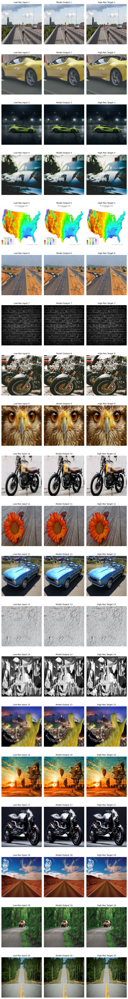

In [14]:
def show_predictions(model, lr_images, hr_images, n=5):
    preds = model.predict(lr_images[:n])
    plt.figure(figsize=(9, 3.5 * n))
    for i in range(n):
        plt.subplot(n, 3, i * 3 + 1)
        plt.imshow(lr_images[i])
        plt.title(f"Low-Res Input {i+1}", fontsize=10)
        plt.axis("off")

        plt.subplot(n, 3, i * 3 + 2)
        plt.imshow(np.clip(preds[i], 0, 1))
        plt.title(f"Model Output {i+1}", fontsize=10)
        plt.axis("off")

        plt.subplot(n, 3, i * 3 + 3)
        plt.imshow(hr_images[i])
        plt.title(f"High-Res Target {i+1}", fontsize=10)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

show_predictions(model, lr_test, hr_test, n=20)